# Import Packages and Load Dataset

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

%matplotlib widget

from matplotlib import cm
from scipy.special import gamma
from sklearn.decomposition import PCA
from IPython import display
from tactile_encoding import TacSet, MGGD


# Load dataset
streams = np.load('touch_stream.npz')
[sCurvy, sRound, sPlateau] = [streams[file] for file in streams.files]
labels = ['curvy', 'round', 'plateau']

def compute_vec(data):
    pca = PCA(n_components=2)
    mat = -np.squeeze(data)
    mat = (mat - np.min(mat))/np.std(mat)
    x, y = np.where(mat > np.mean(mat))
    X = np.squeeze(np.dstack((x, y)))
    x0, y0 = np.ceil(np.mean(X, axis=0))
    pca.fit(X)
    V = pca.components_
    a = np.sqrt(pca.singular_values_)
    V[0, :] *= a[1] # Edge width
    V[1, :] *= 1.7*a[0] # Edge direction
    origin = np.array([[y0, y0],[x0, x0]])
    W = np.vstack((V[0, :], -V[0, :]))
    V = np.vstack((V[1, :], -V[1, :]))
    m = 1
    beta = a[1]
    mu = np.array([x0, y0])
    M = pca.get_covariance()
    mggd = M
    return origin, V, W, mggd

# Edge Orientation and Width Detection
1. Generalized Gaussian Encoding for Tactile Signals
* F. Pascal, L. Bombrun, J. -Y. Tourneret and Y. Berthoumieu, "Parameter Estimation For Multivariate Generalized Gaussian Distributions," in IEEE Transactions on Signal Processing, vol. 61, no. 23, pp. 5960-5971, Dec.1, 2013, doi: 10.1109/TSP.2013.2282909.

In [20]:
frames = np.min([len(sCurvy), len(sRound), len(sPlateau)])

# Visualize data steamfig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=100)
def visualize(stream):
    dataset = stream
    fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=100)
    im = ax.imshow(dataset[0])
    origin, V, W, mggd = compute_vec(dataset[0])
    
    quiverV = ax.quiver(*origin, V[:,0], V[:,1], color=['r'], scale=20)
    quiverW = ax.quiver(*origin, W[:,0], W[:,1], color=['b'], scale=20, headaxislength=0, headwidth=0, headlength=0)
    def update(frame):
        im.set_data(dataset[frame])
        origin, V, W, _ = compute_vec(dataset[frame])
        quiverV.set_offsets(origin.T)
        quiverV.set_UVC(V[:,0], V[:,1])
        quiverW.set_offsets(origin.T)
        quiverW.set_UVC(W[:,0], W[:,1])
        return [im, quiver]
    anim = animation.FuncAnimation(fig=fig, func=update, frames=frames, interval=30, blit=True, repeat=False)
    video = anim.to_html5_video()
    html = display.HTML(video)
    display.display(html)

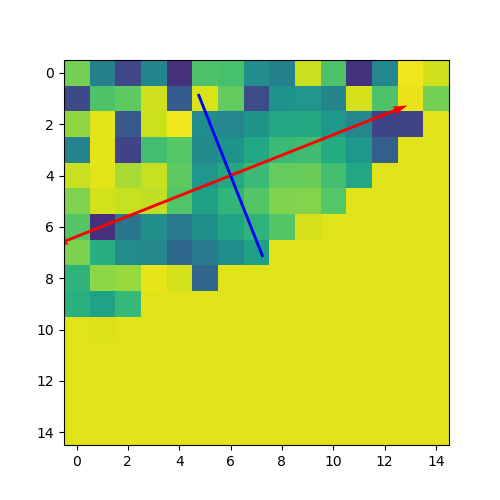

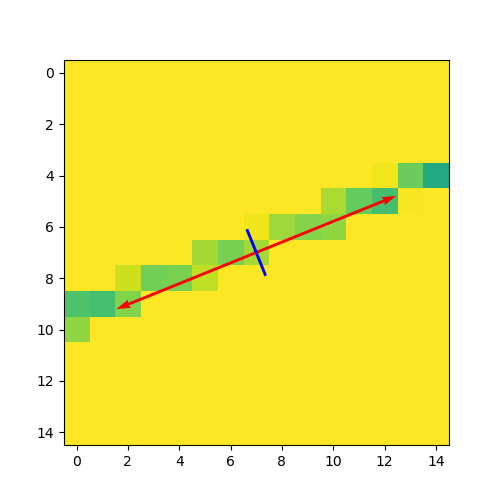

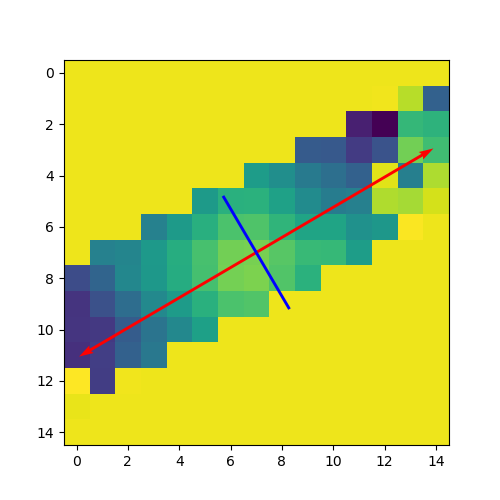

In [21]:
visualize(sCurvy)
visualize(sRound)
visualize(sPlateau)